In [1]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import scipy.stats as st
import os
from pathlib import Path
import dynamic_routing_analysis as dra

from allensdk.core.reference_space_cache import ReferenceSpaceCache

%matplotlib widget

In [2]:
output_dir = dra.ANALYSIS_ROOT_PATH / "ccf_cache"
reference_space_key = "annotation/ccf_2022"
resolution = 10
rspc = ReferenceSpaceCache(resolution, reference_space_key, manifest=Path(output_dir) / 'manifest.json')

# get structure tree
# ID 1 is the adult mouse structure graph
tree = rspc.get_structure_tree(structure_graph_id=1) 

# get id_acronym map
id_acronym_map = tree.get_id_acronym_map()

# make reference space object
rsp = rspc.get_reference_space()

# get annotation volume
annotation, meta = rspc.get_annotation_volume()

In [72]:
# tree.get_structures_by_name(['Isocortex'])
# id_acronym_map['Thalamus']
parents=tree.parents([id_acronym_map['SNc']])[0]['structure_id_path']
for parent in parents:
    print(tree.get_structures_by_id([parent])[0]['name'])

# tree.get_structures_by_id([id_acronym_map['FRP']])

root
Basic cell groups and regions
Brain stem
Midbrain
Midbrain, behavioral state related


In [ ]:
# id_acronym_map['AUDp']
# tree.get_structures_by_acronym(['AUDp'])
# tree.parents([id_acronym_map['LGd']])

# tree.children([id_acronym_map['LGd']])
# tree.get_structures_by_name(['Isocortex'])

# Use these broad categories
broad_categories = [
    'Isocortex',
    'Hippocampal formation',
    'Cerebral nuclei',
    'Thalamus', 
    'Hypothalamus',
    'Midbrain', #sensory vs. motor vs. behavioral state?
    'Hindbrain',
    'Cerebellum'
]

broad_category_ids = []
for category in broad_categories:
    structures = tree.get_structures_by_name([category])
    if len(structures) > 0:
        broad_category_ids.append(structures[0]['id'])
    else:
        raise ValueError(f"Broad category '{category}' not found in structure tree.")

broad_category_ids


[315, 1089, 623, 549, 1097, 313, 1065, 512]

In [79]:
more_specific_categories = [
    'Thalamus, sensory-motor cortex related',
    'Thalamus, polymodal association cortex related',
    'Midbrain, motor related',
    'Midbrain, sensory related',
    'Midbrain, behavioral state related',
]

more_specific_category_ids = []
for category in more_specific_categories:
    structures = tree.get_structures_by_name([category])
    if len(structures) > 0:
        more_specific_category_ids.append(structures[0]['id'])
    else:
        raise ValueError(f"More specific category '{category}' not found in structure tree.")

In [81]:
sel_structure = 'SCm'
parents=tree.parents([id_acronym_map[sel_structure]])[0]['structure_id_path']

for parent in parents:
    if parent in broad_category_ids:
        print(tree.get_structures_by_id([parent])[0]['name'])
    # if parent in more_specific_category_ids:
    #     print(tree.get_structures_by_id([parent])[0]['name'])

Midbrain


In [78]:
parents

[997, 8, 343, 313, 323]

In [ ]:
def sort_structures_by_region(structure_acronym,broad_categories=None):

    output_dir = dra.ANALYSIS_ROOT_PATH / "ccf_cache"
    reference_space_key = "annotation/ccf_2022"
    resolution = 10
    rspc = ReferenceSpaceCache(resolution, reference_space_key, manifest=Path(output_dir) / 'manifest.json')

    # get structure tree
    # ID 1 is the adult mouse structure graph
    tree = rspc.get_structure_tree(structure_graph_id=1) 

    # get id_acronym map
    id_acronym_map = tree.get_id_acronym_map()
    
    if broad_categories is None:
        broad_categories = [
            'Isocortex',
            'Hippocampal formation',
            'Cerebral nuclei',
            'Thalamus', 
            'Hypothalamus',
            'Midbrain',
            'Hindbrain',
            'Cerebellum'
        ]

    broad_category_ids = []
    for category in broad_categories:
        structures = tree.get_structures_by_name([category])
        if len(structures) > 0:
            broad_category_ids.append(structures[0]['id'])
        else:
            raise ValueError(f"Broad category '{category}' not found in structure tree.")

    parents=tree.parents([id_acronym_map[structure_acronym]])[0]['structure_id_path']

    for parent in parents:
        if parent in broad_category_ids:
            return tree.get_structures_by_id([parent])[0]['name']

In [2]:
sort_structures_by_region('FRP')

NameError: name 'sort_structures_by_region' is not defined

## examples using the atlas

In [ ]:
#neuron's ccf coordinate:
#(A/P, D/V, M/L)
coord=(500, 200, 400)
struct_id=annotation[coord]
struct_info=tree.get_structures_by_id([struct_id])

struct_info

In [ ]:
parents=tree.parents([struct_id])
parents

In [6]:
parent_mask = rsp.make_structure_mask([parents[0]['id']])
structure_mask = rsp.make_structure_mask([struct_id])

In [ ]:
#plot structure mask
fig,ax=plt.subplots(1,1)
ax.imshow(parent_mask[coord[0],:,:],cmap='Blues',alpha=0.3)
ax.imshow(structure_mask[coord[0],:,:],cmap='Reds',alpha=0.3)

In [ ]:
#plot coronal section
#coronal slice at neuron's location
data = rsp.get_slice_image(0, coord[0]*10)

fig = plt.figure(figsize=(10,9))
ax=plt.subplot(1,1,1)
ax.imshow(data,extent=[1140,0,800,0]) 
ax.imshow(parent_mask[coord[0],:,:],cmap='Blues',alpha=0.3)
ax.imshow(structure_mask[coord[0],:,:],cmap='Reds',alpha=0.3)
ax.plot(coord[2],coord[1],'r*')
ax.set_xlabel('M-L')
ax.set_ylabel('D-V')
plt.gca().invert_xaxis() #for some reason necessary to make left=left

## plot decoder accuracy on CCF

In [10]:
# load deocder accuracy by CCF area

# ccf_coords_by_session_area = pd.read_csv(
#     dra.DECODING_ROOTH_PATH
#     / "new_annotations"
#     / "linear_shift_20_units/combined/all_unit_linear_shift_use_more_trials.csv"
# )
ccf_coords_by_session_area = pd.read_csv(r"\\allen\programs\mindscope\workgroups\dynamicrouting\shailaja\population_decoding\all_unit_linear_shift_use_more_trials.csv")

In [51]:
#make structure mask and collect decoder accuracy for these areas
# structure_list=['MOs','MOp','SS','ORB','FRP','ACA','ILA','PL','AI','RSP','VIS','AUD','PTLp']
# structure_list=['MOs']
structure_list=['CP']
dprime_threshold=1.0

area_insertions=ccf_coords_by_session_area.query('area.str.startswith(@structure_list[0]) and cross_modal_dprime>@dprime_threshold')
structure_id_list=[id_acronym_map[structure_list[0]]]

if len(structure_list)>1:
    for sel_area in structure_list[1:]:
        area_insertions=pd.concat([area_insertions,ccf_coords_by_session_area.query('area.str.startswith(@sel_area) and cross_modal_dprime>@dprime_threshold')],axis=0)
        structure_id_list.append(id_acronym_map[sel_area])

area_mask=rsp.make_structure_mask(structure_id_list)

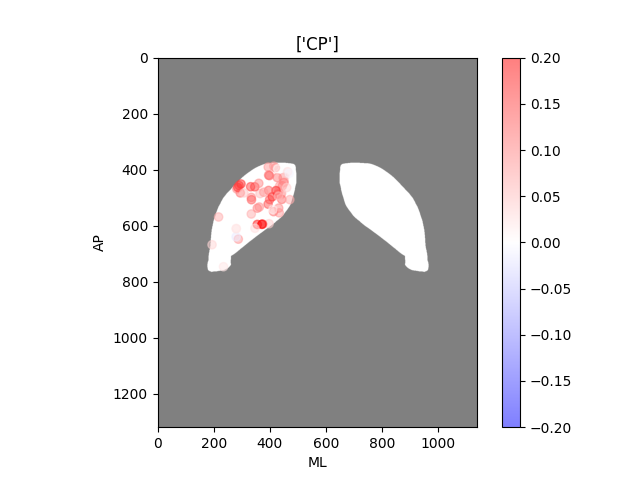

In [52]:
#horizontal view
fig,ax=plt.subplots(1,1)
ax.imshow(np.max(area_mask[:,:,:],axis=1),cmap='gray',alpha=0.5)
points=ax.scatter(area_insertions['ccf_ml_mean']/10,area_insertions['ccf_ap_mean']/10,
                  c=area_insertions['true_accuracy']-area_insertions['null_accuracy_median'],
                  alpha=0.5,cmap='bwr',vmin=-0.20,vmax=0.20)
ax.set_xlabel('ML')
ax.set_ylabel('AP')
ax.set_title(structure_list)
ax.set_aspect('equal')
fig.colorbar(ax=ax,mappable=points)

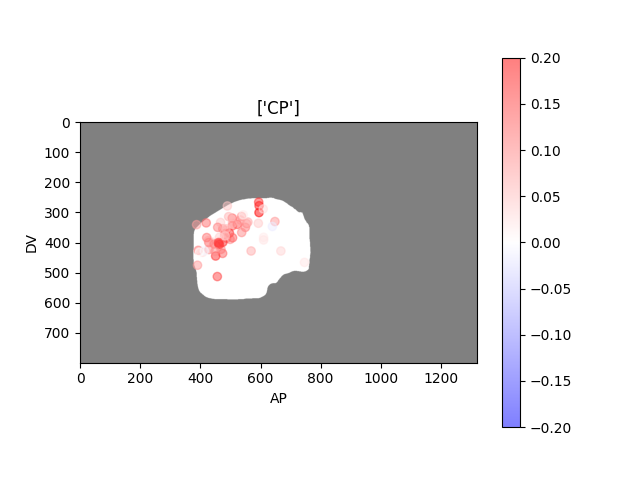

In [53]:
#sagittal view
fig,ax=plt.subplots(1,1)
ax.imshow(np.max(area_mask[:,:,:],axis=2).T,cmap='gray',alpha=0.5)
points=ax.scatter(area_insertions['ccf_ap_mean']/10,area_insertions['ccf_dv_mean']/10,
                  c=area_insertions['true_accuracy']-area_insertions['null_accuracy_median'],
                  alpha=0.5,cmap='bwr',vmin=-0.20,vmax=0.20)
ax.set_xlabel('AP')
ax.set_ylabel('DV')
ax.set_title(structure_list)
ax.set_aspect('equal')
fig.colorbar(ax=ax,mappable=points)

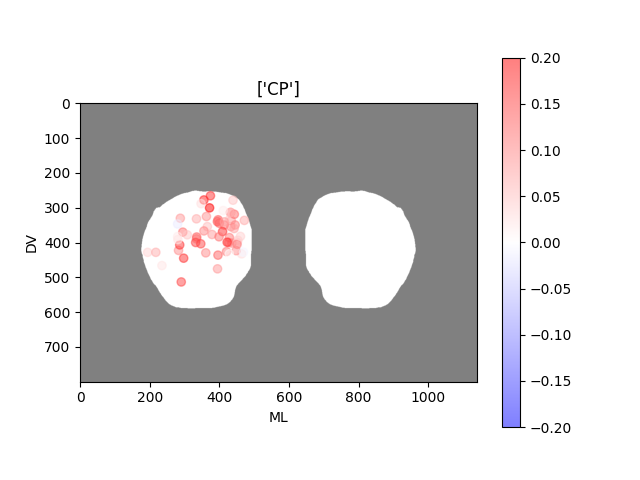

In [54]:
#coronal view
fig,ax=plt.subplots(1,1)
ax.imshow(np.max(area_mask[:,:,:],axis=0),cmap='gray',alpha=0.5)
points=ax.scatter(area_insertions['ccf_ml_mean']/10,area_insertions['ccf_dv_mean']/10,
                  c=area_insertions['true_accuracy']-area_insertions['null_accuracy_median'],
                  alpha=0.5,cmap='bwr',vmin=-0.20,vmax=0.20)
ax.set_xlabel('ML')
ax.set_ylabel('DV')
ax.set_title(structure_list)
ax.set_aspect('equal')
fig.colorbar(ax=ax,mappable=points)

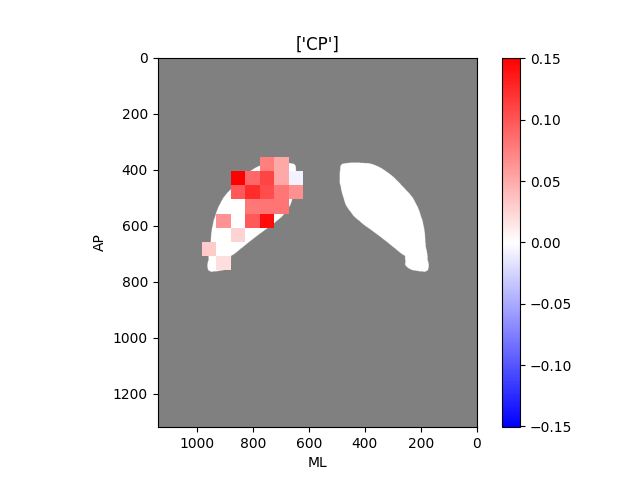

In [56]:
#spatially bin results

#horizontal view - histogram
#ccf shape = a/p, d/v, m/l

plot_data=area_insertions['true_accuracy']-area_insertions['null_accuracy_median']

#size of bins in microns
binsize=50

xsize=annotation.shape[2]
ysize=annotation.shape[0]

xinput=area_insertions['ccf_ml_mean'].to_numpy(dtype=float)/10
yinput=area_insertions['ccf_ap_mean'].to_numpy(dtype=float)/10

statbins = st.binned_statistic_2d(xinput, yinput, plot_data, statistic='mean', bins=(int(xsize/binsize), int(ysize/binsize)), range=((0,xsize), (0,ysize)))

minrange=np.nanmin(statbins.statistic)
maxrange=np.nanmax(statbins.statistic)

max=np.nanmax(np.abs([minrange,maxrange]))

fig,ax=plt.subplots(1,1)
ax.imshow(np.max(area_mask[:,:,:],axis=1),cmap='gray',alpha=0.5)
values=ax.imshow(statbins.statistic.T,extent=[xsize,0,ysize,0],cmap='bwr',vmin=-max,vmax=max)#,alpha=0.5
ax.set_aspect('equal')
ax.set_xlabel('ML')
ax.set_ylabel('AP')
ax.set_title(structure_list)
fig.colorbar(ax=ax,mappable=values)

## plot decoding results on CCF slices - coronal

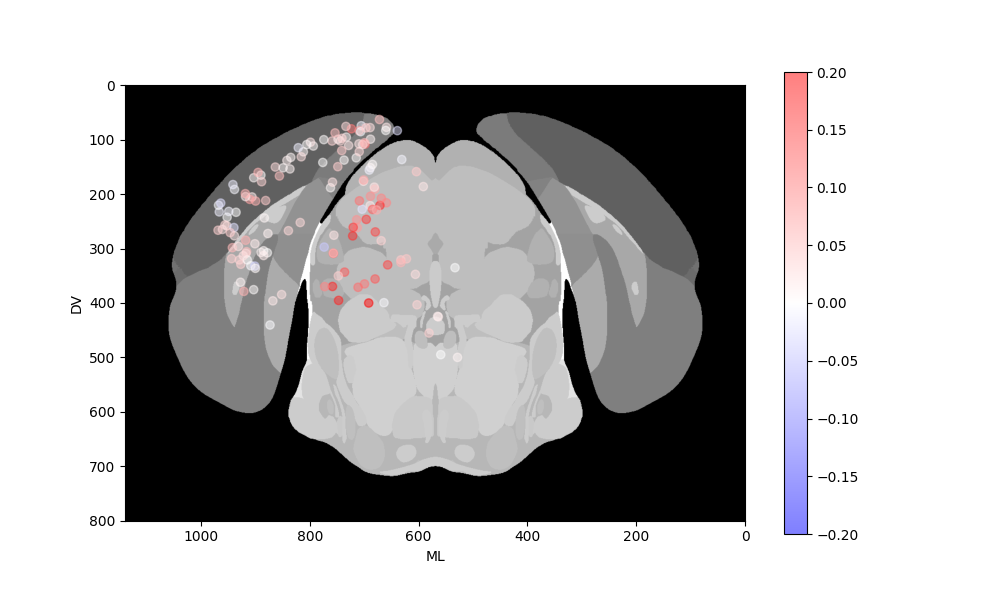

In [12]:
# plot single coronal slice
slice_pos=9500

slice_image= rsp.get_slice_image(0, slice_pos)
results= ccf_coords_by_session_area.query('ccf_ap_mean >= @slice_pos-500 and ccf_ap_mean <= @slice_pos+500')

def rgb2gray(rgb):
    return np.dot(rgb[...,:3], [0.2989, 0.5870, 0.1140])
 
gray_image = rgb2gray(slice_image) 

fig = plt.figure(figsize=(10,6))
ax=plt.subplot(1,1,1)
# ax.imshow(data,cmap='gray',extent=[1140,0,800,0]) 
ax.imshow(gray_image,extent=[1140,0,800,0],cmap='gray') 

points=ax.scatter(1140-results['ccf_ml_mean']/10,results['ccf_dv_mean']/10,c=results['true_accuracy']-results['null_accuracy_median'],alpha=0.5,cmap='bwr',vmin=-0.2,vmax=0.2)
ax.set_xlabel('ML')
ax.set_ylabel('DV')
fig.colorbar(ax=ax,mappable=points)

C:\Users\ethan.mcbride\AppData\Local\Temp\ipykernel_21880\1787992269.py:17: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure(figsize=(10,6))


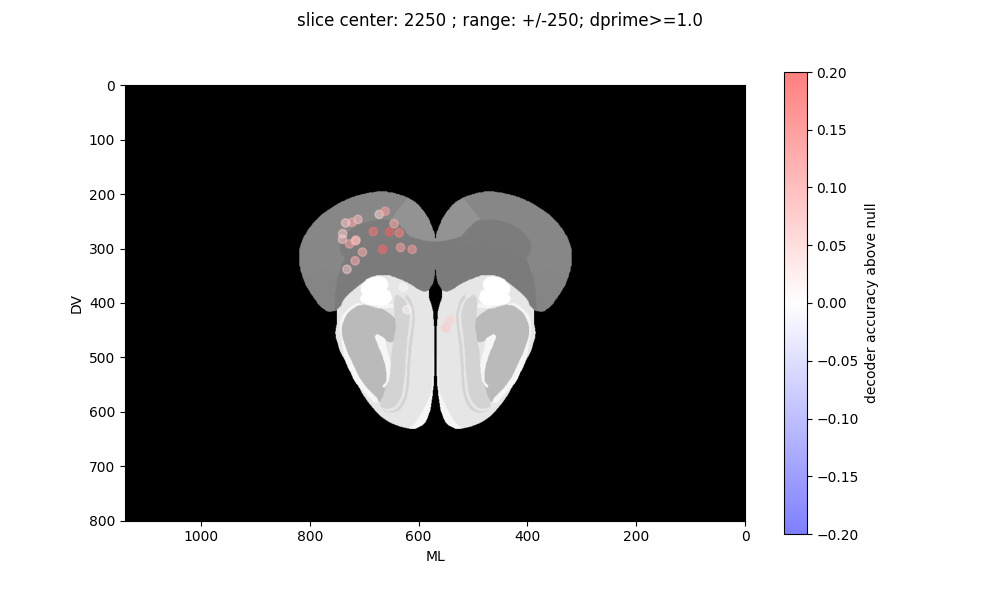

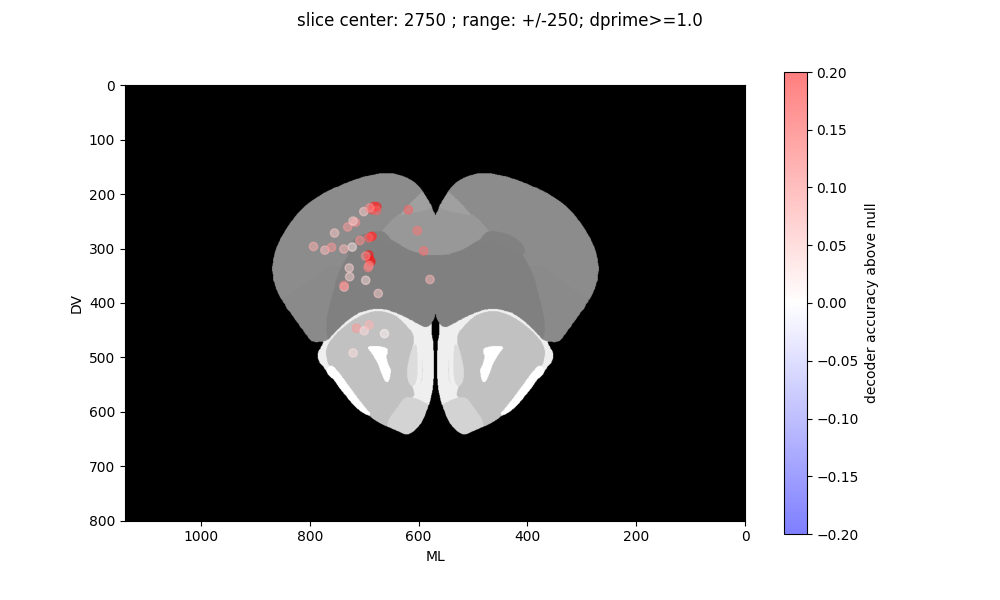

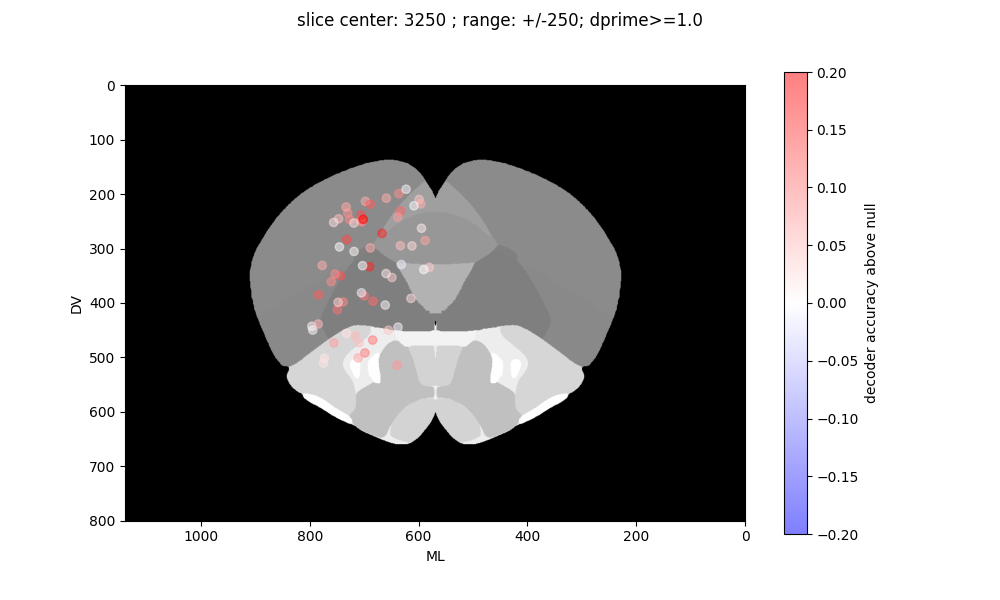

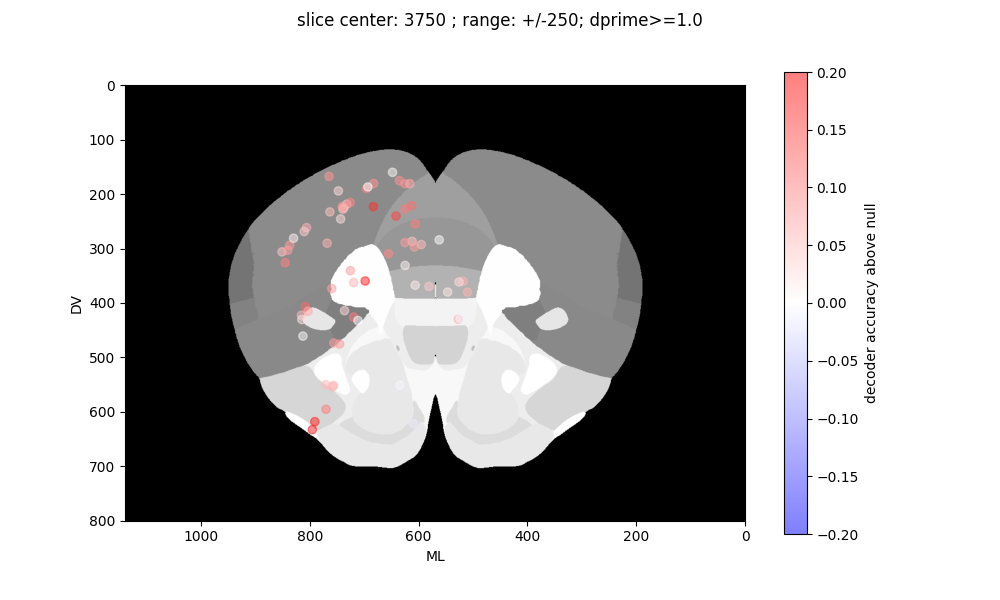

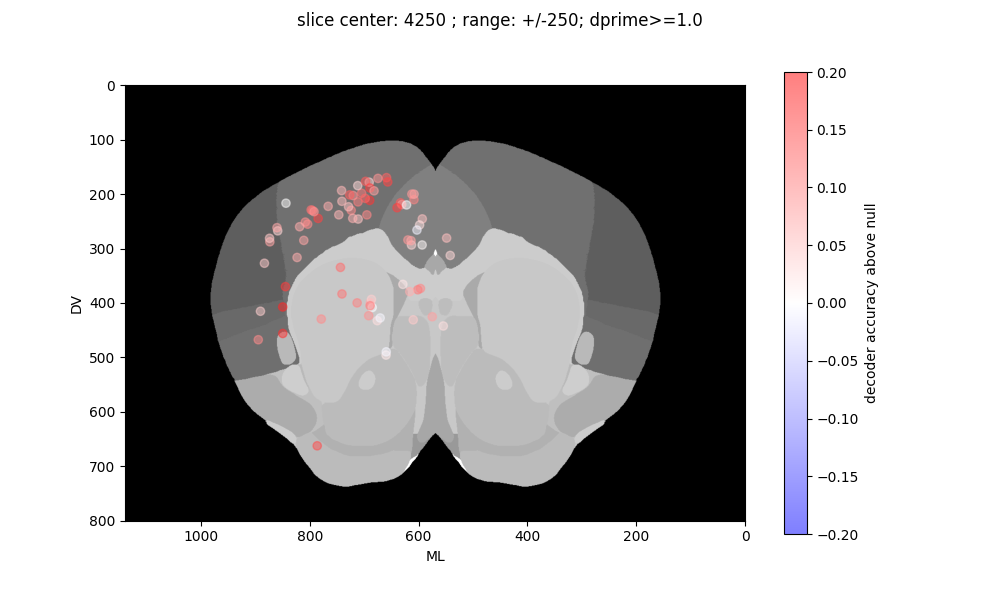

...

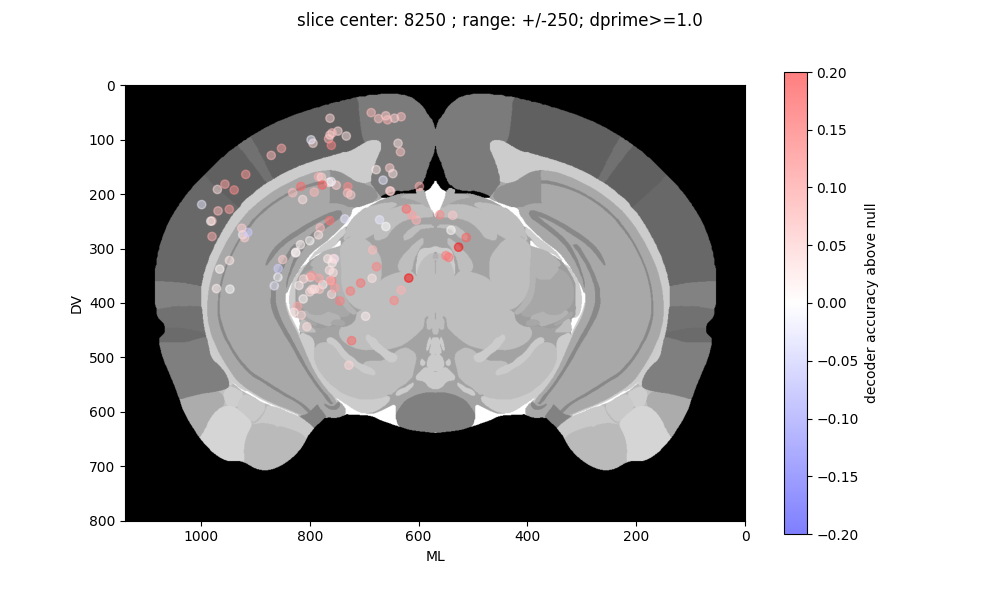

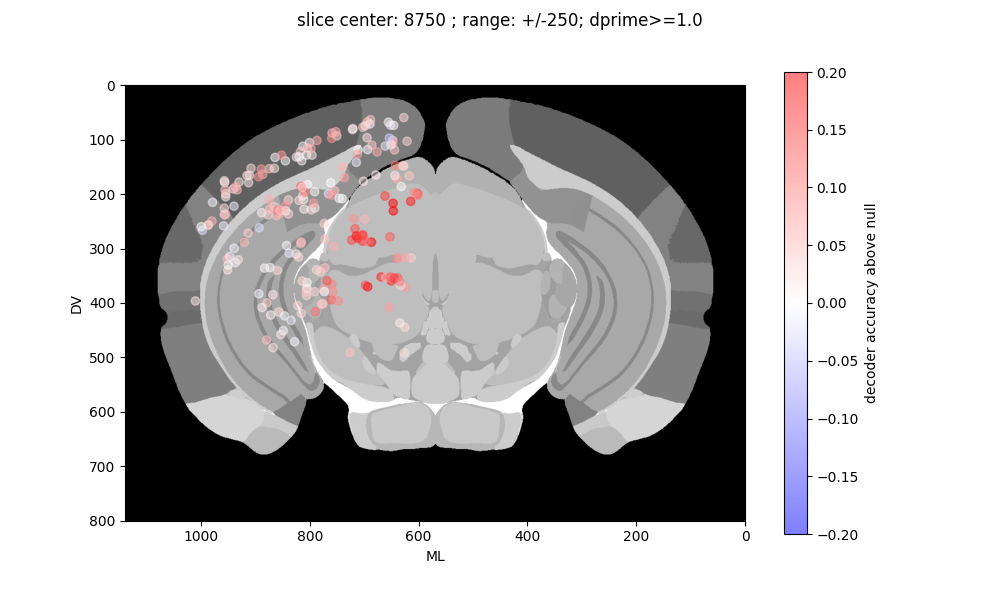

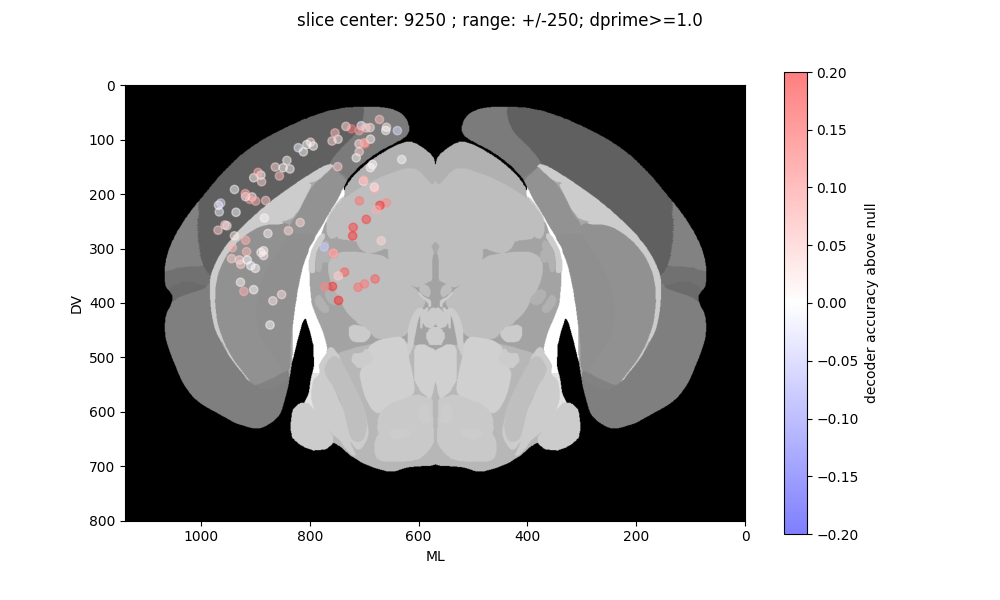

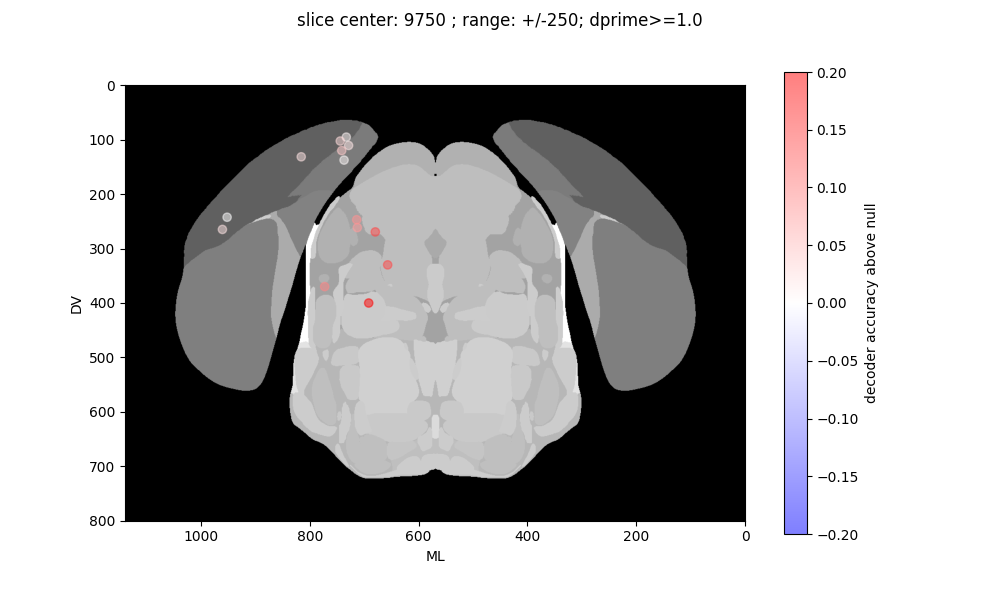

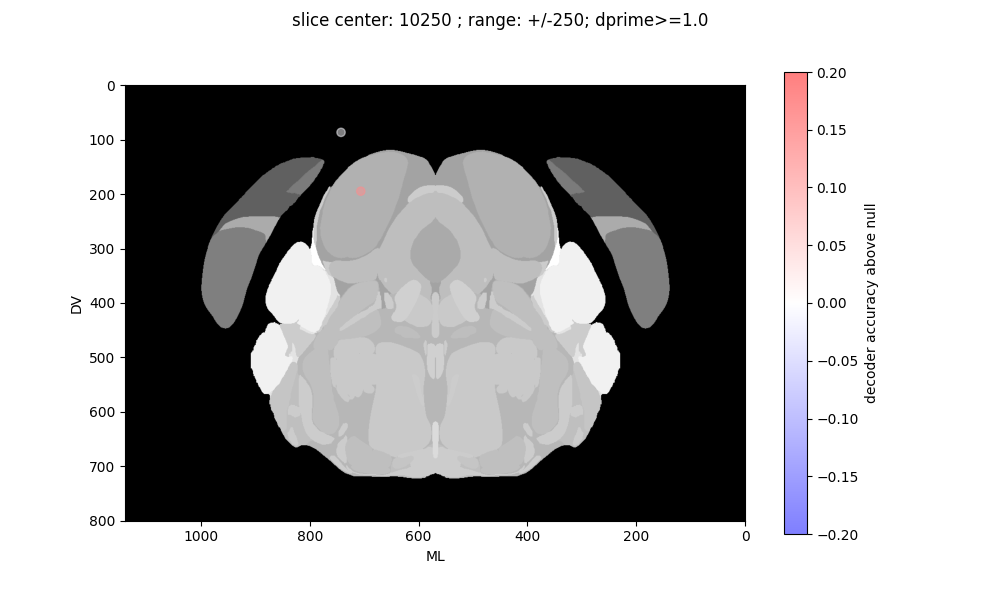

In [13]:
# plot all slices
dprime_thresh=1.0
slice_size=500
slice_pos_array=np.arange(2000+slice_size/2,10500,slice_size)
savepath=r"C:\Users\ethan.mcbride\OneDrive - Allen Institute\quick figures\2024-05-21-decoding_topography"

for slice_pos in slice_pos_array:
    slice_image= rsp.get_slice_image(0, slice_pos)
    results= ccf_coords_by_session_area.query('ccf_ap_mean >= @slice_pos-@slice_size/2 and ccf_ap_mean <= @slice_pos+@slice_size/2 and \
                                               cross_modal_dprime>=@dprime_thresh and project=="DynamicRouting" and area!="all"')

    def rgb2gray(rgb):
        return np.dot(rgb[...,:3], [0.2989, 0.5870, 0.1140])
    
    gray_image = rgb2gray(slice_image) 

    fig = plt.figure(figsize=(10,6))
    ax=plt.subplot(1,1,1)
    # ax.imshow(data,cmap='gray',extent=[1140,0,800,0]) 
    ax.imshow(gray_image,extent=[1140,0,800,0],cmap='gray') 

    points=ax.scatter(1140-results['ccf_ml_mean']/10,results['ccf_dv_mean']/10,c=results['true_accuracy']-results['null_accuracy_median'],alpha=0.5,cmap='bwr',vmin=-0.2,vmax=0.2)
    ax.set_xlabel('ML')
    ax.set_ylabel('DV')
    fig.colorbar(ax=ax,mappable=points,label='decoder accuracy above null')
    fig.suptitle('slice center: '+str(int(slice_pos))+' ; range: +/-'+str(int(slice_size/2))+'; dprime>='+str(dprime_thresh))

    # filesavepath=os.path.join(savepath,'coronal_slice_'+str(int(slice_pos))+'.png')
    # plt.savefig(filesavepath,dpi=300)
    # plt.close(fig)

## plot decocer results on CCF - horizontal

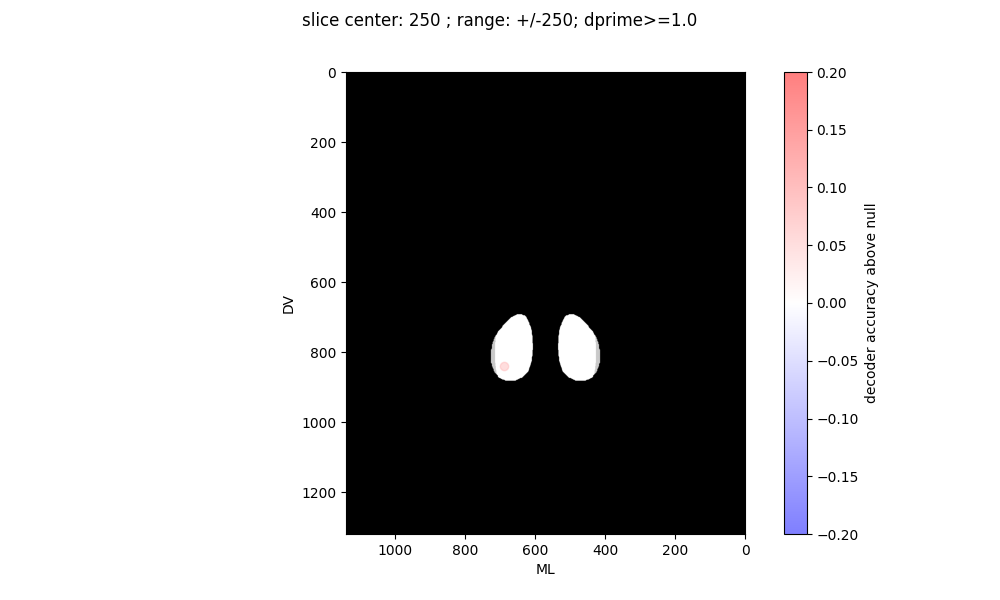

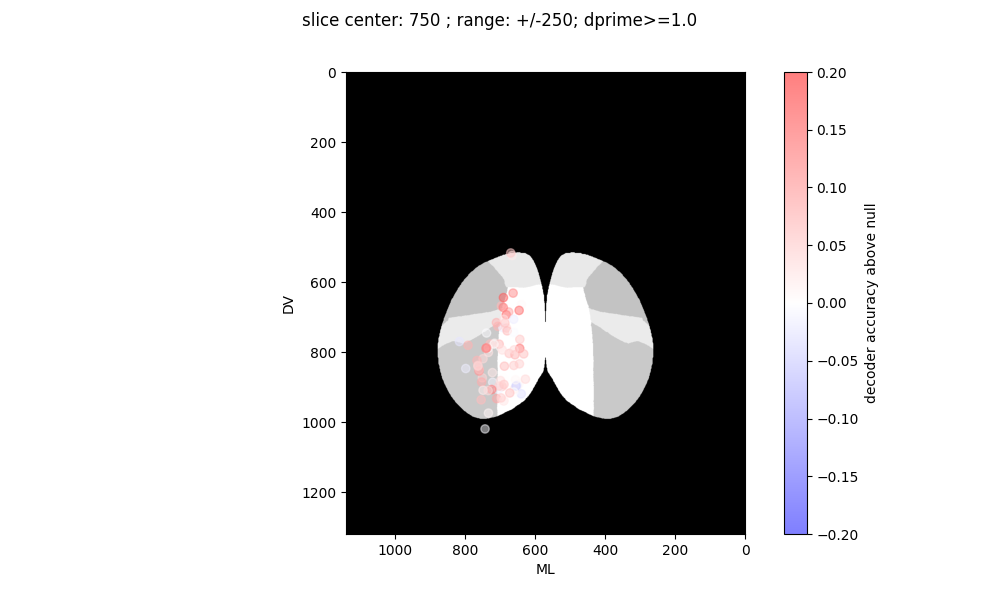

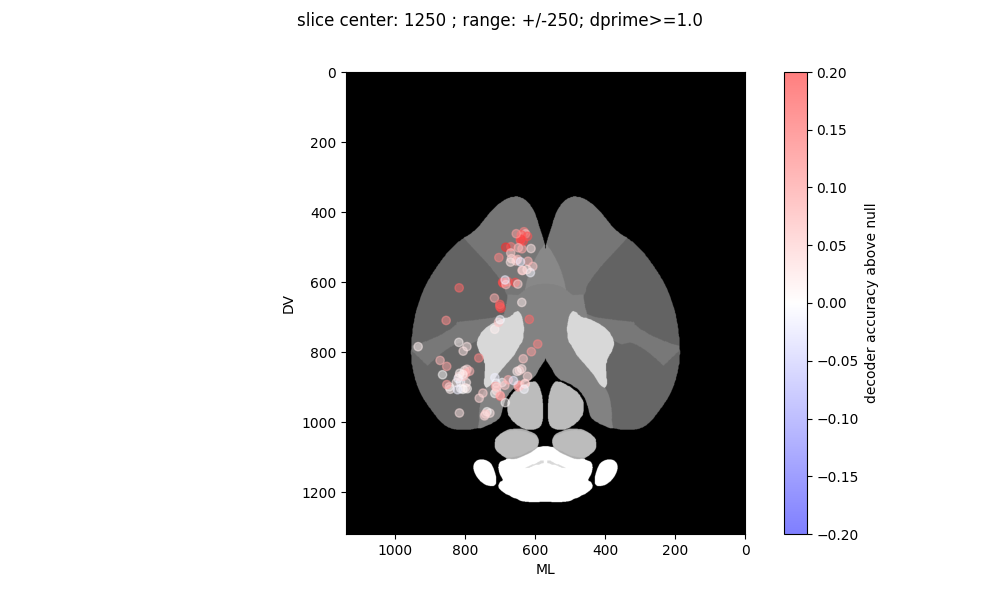

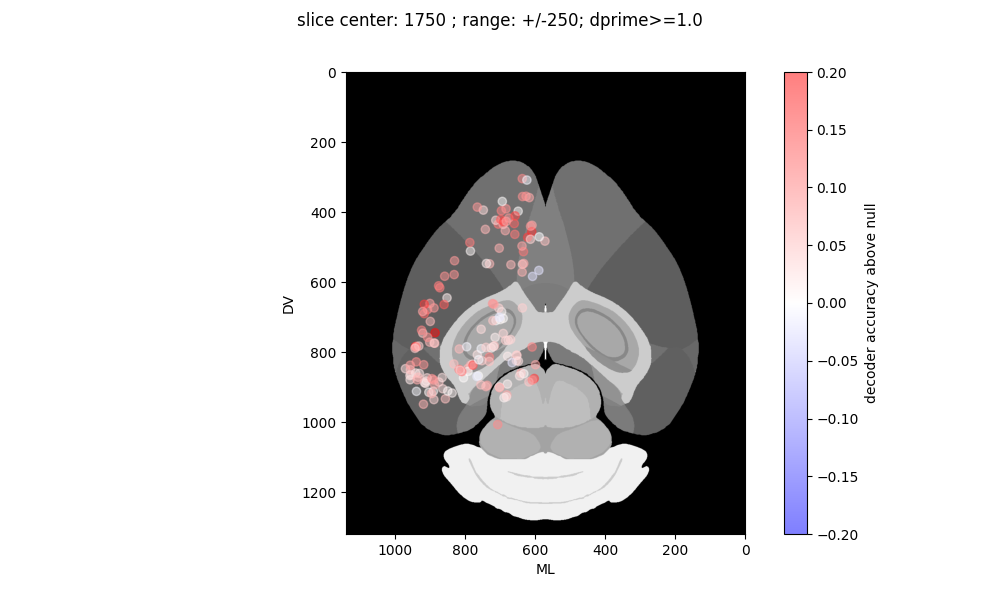

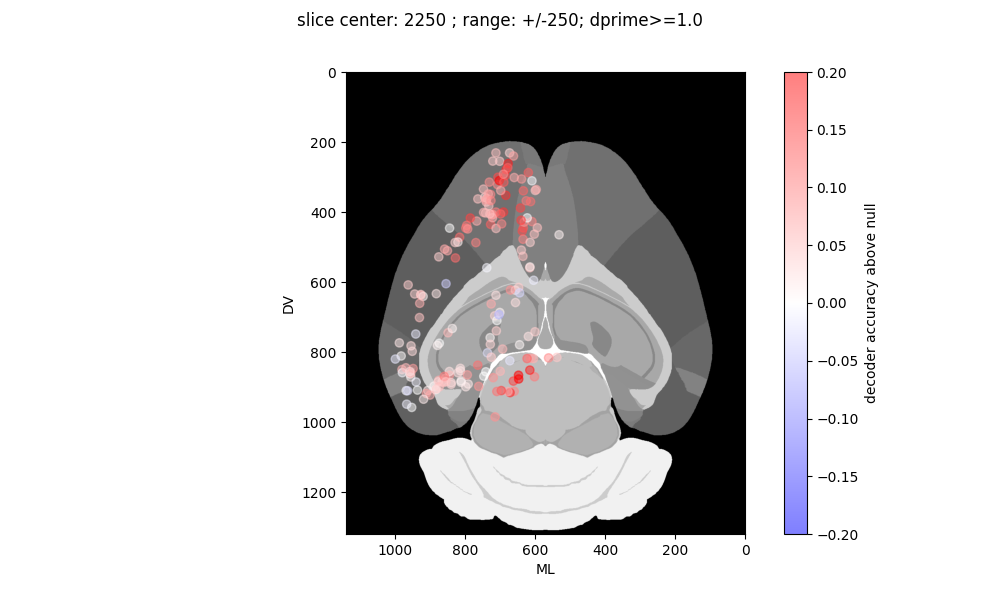

...

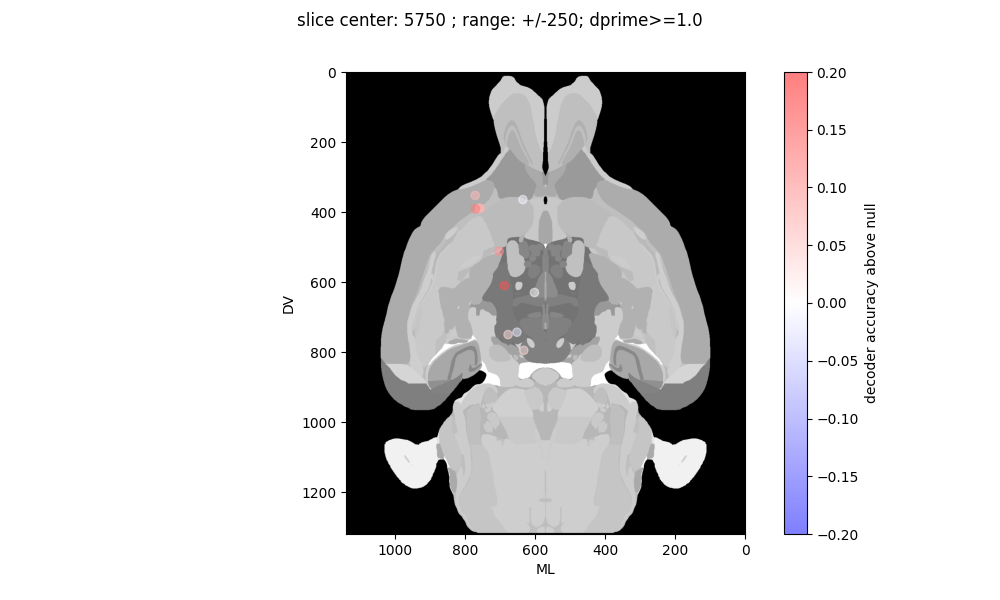

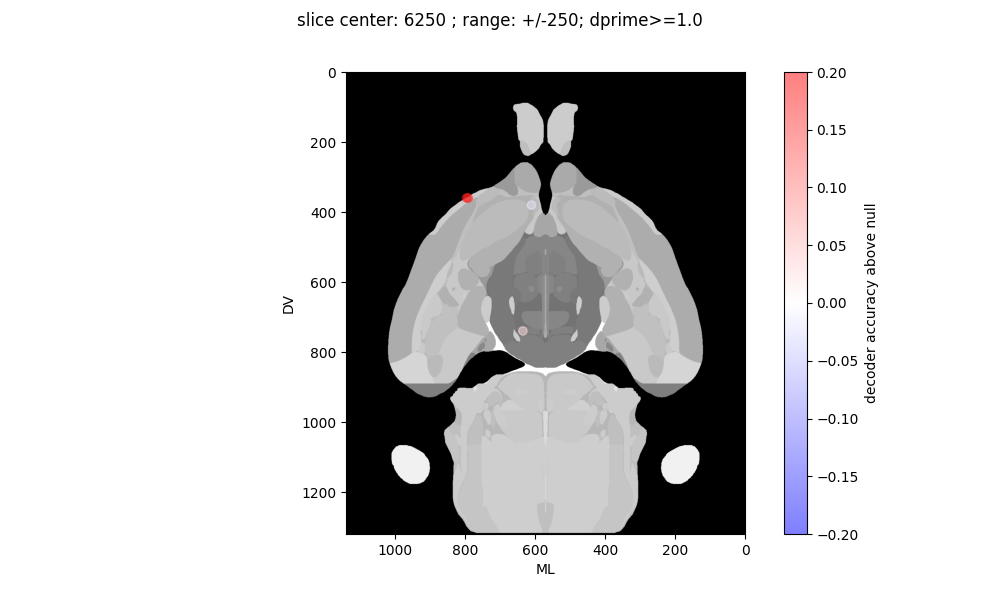

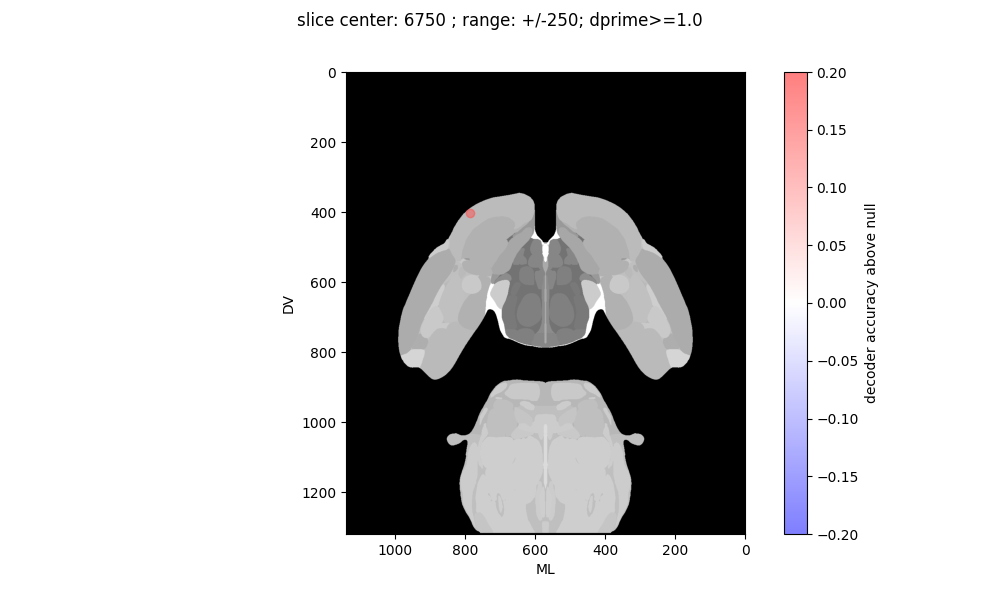

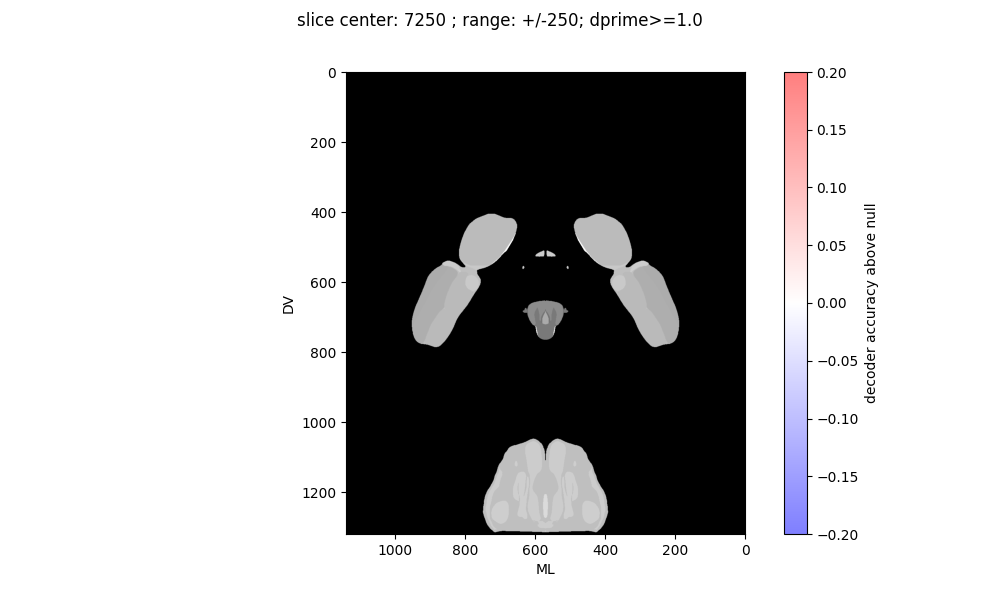

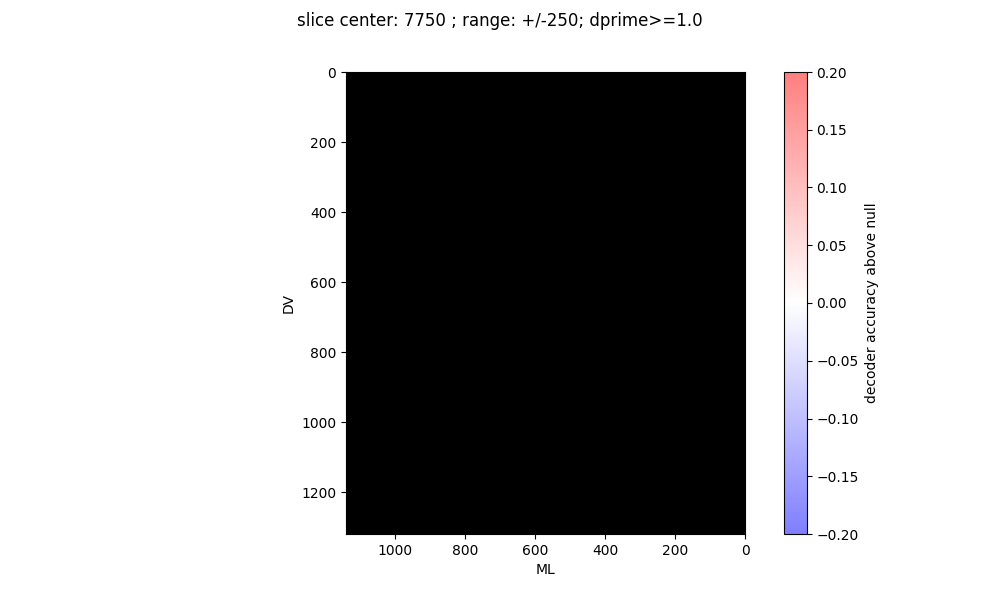

In [14]:
# plot all slices
dprime_thresh=1.0
slice_size=500
slice_pos_array=np.arange(slice_size/2,8000+slice_size/2,slice_size)
savepath=r"C:\Users\ethan.mcbride\OneDrive - Allen Institute\quick figures\2024-05-21-decoding_topography"

for slice_pos in slice_pos_array:
    slice_image= rsp.get_slice_image(1, slice_pos)
    results= ccf_coords_by_session_area.query('ccf_dv_mean >= @slice_pos-@slice_size/2 and ccf_dv_mean <= @slice_pos+@slice_size/2 and \
                                               cross_modal_dprime>=@dprime_thresh and project=="DynamicRouting" and area!="all"')

    def rgb2gray(rgb):
        return np.dot(rgb[...,:3], [0.2989, 0.5870, 0.1140])
    
    gray_image = rgb2gray(slice_image) 

    fig = plt.figure(figsize=(10,6))
    ax=plt.subplot(1,1,1)
    ax.imshow(gray_image,extent=[1140,0,1320,0],cmap='gray') 

    points=ax.scatter(1140-results['ccf_ml_mean']/10,results['ccf_ap_mean']/10,c=results['true_accuracy']-results['null_accuracy_median'],alpha=0.5,cmap='bwr',vmin=-0.2,vmax=0.2)
    ax.set_xlabel('ML')
    ax.set_ylabel('DV')
    fig.colorbar(ax=ax,mappable=points,label='decoder accuracy above null')
    fig.suptitle('slice center: '+str(int(slice_pos))+' ; range: +/-'+str(int(slice_size/2))+'; dprime>='+str(dprime_thresh))

    # filesavepath=os.path.join(savepath,'horizontal_slice_'+str(int(slice_pos))+'.png')
    # plt.savefig(filesavepath,dpi=300)
    # plt.close(fig)

## plot decoder results on CCF - sagittal

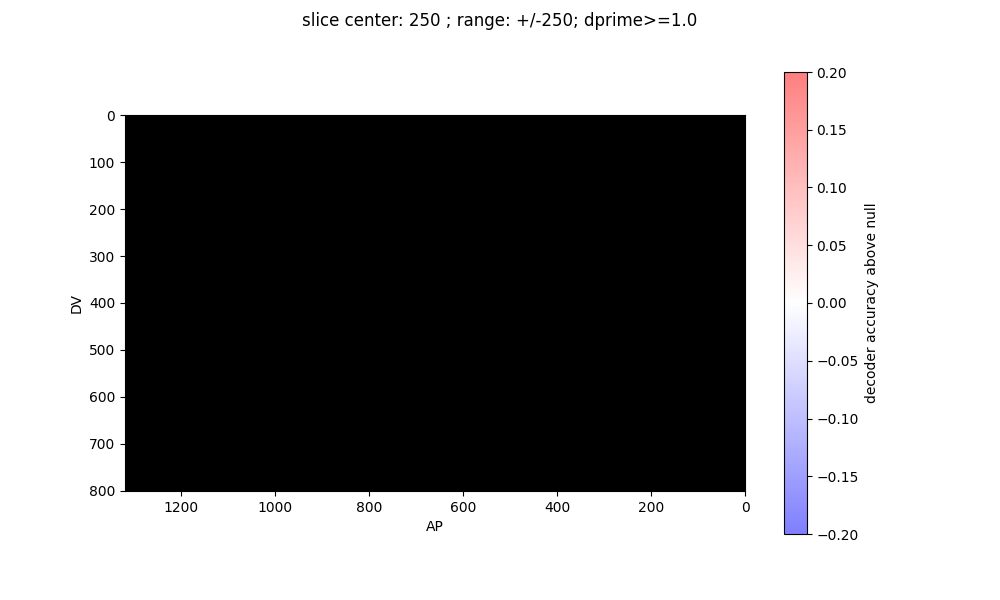

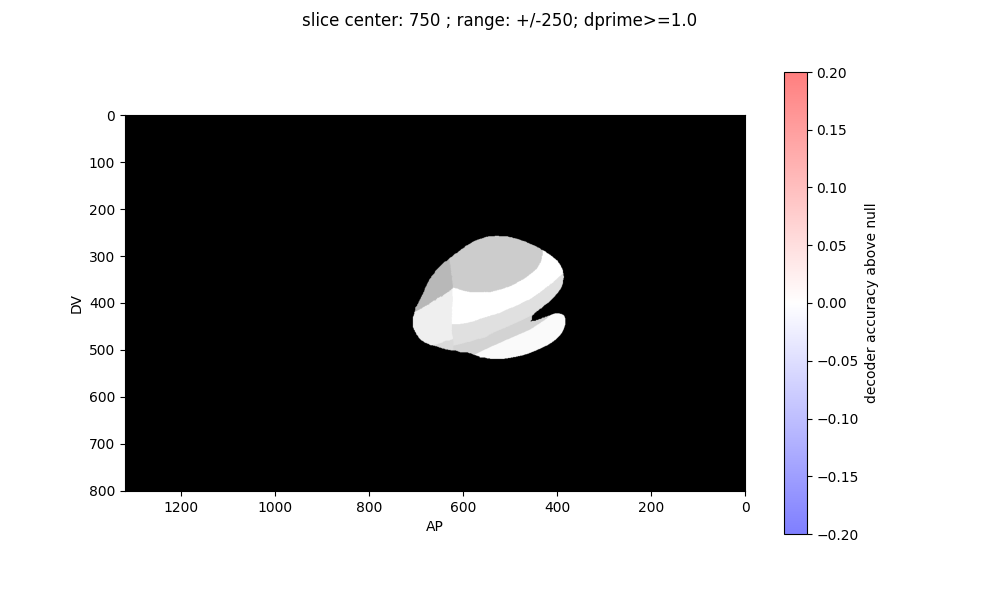

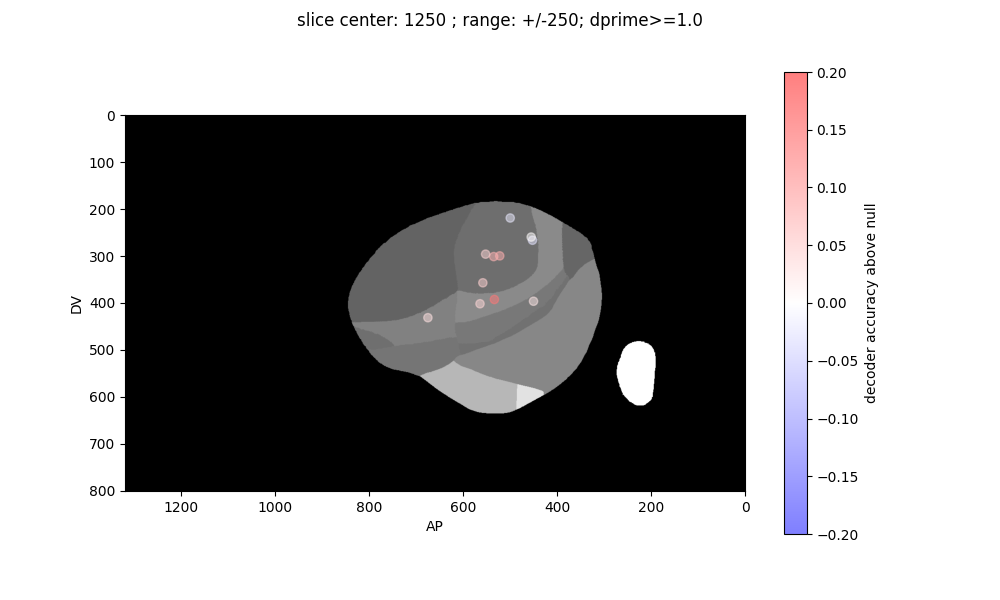

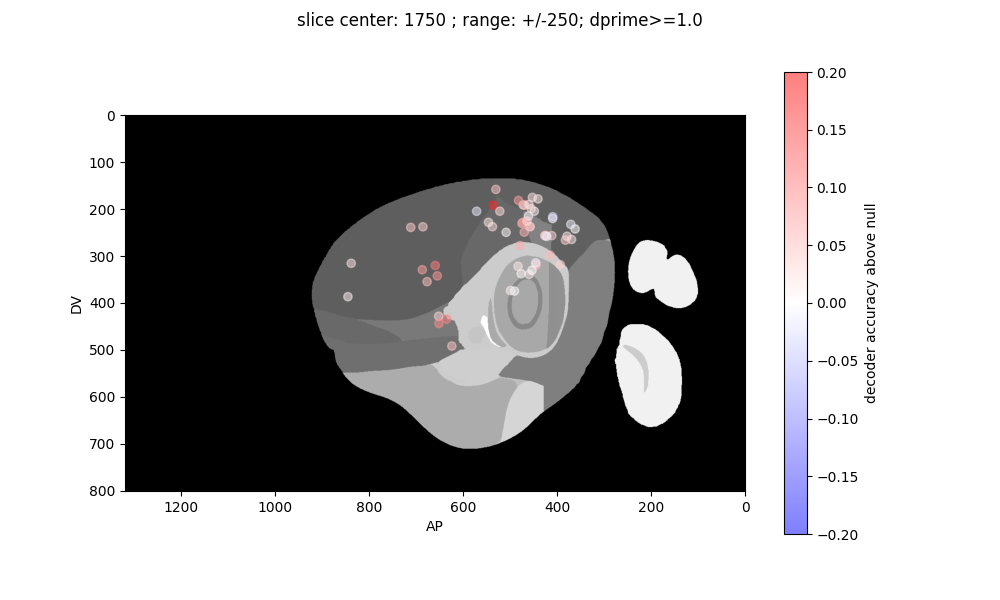

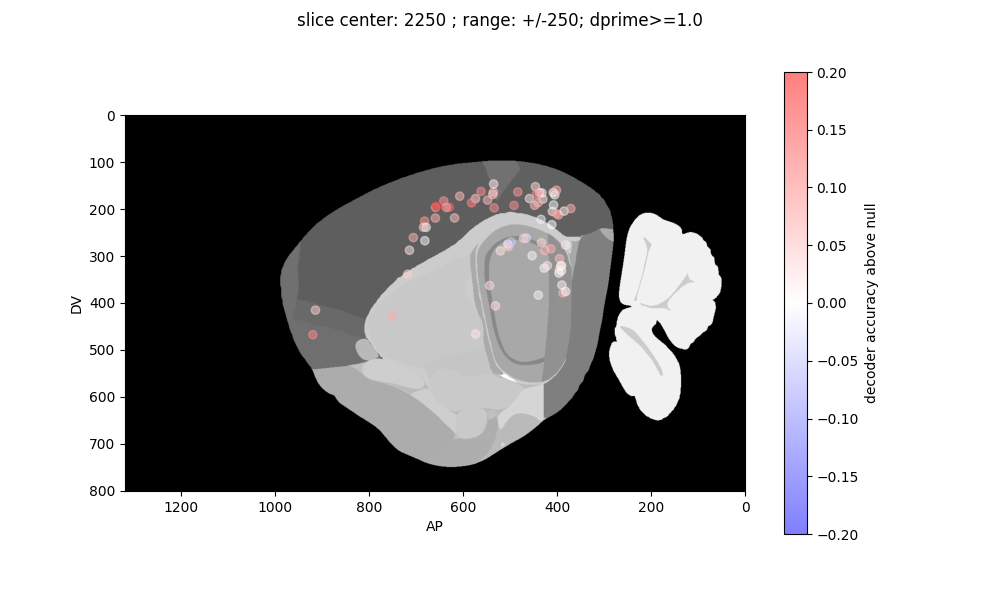

...

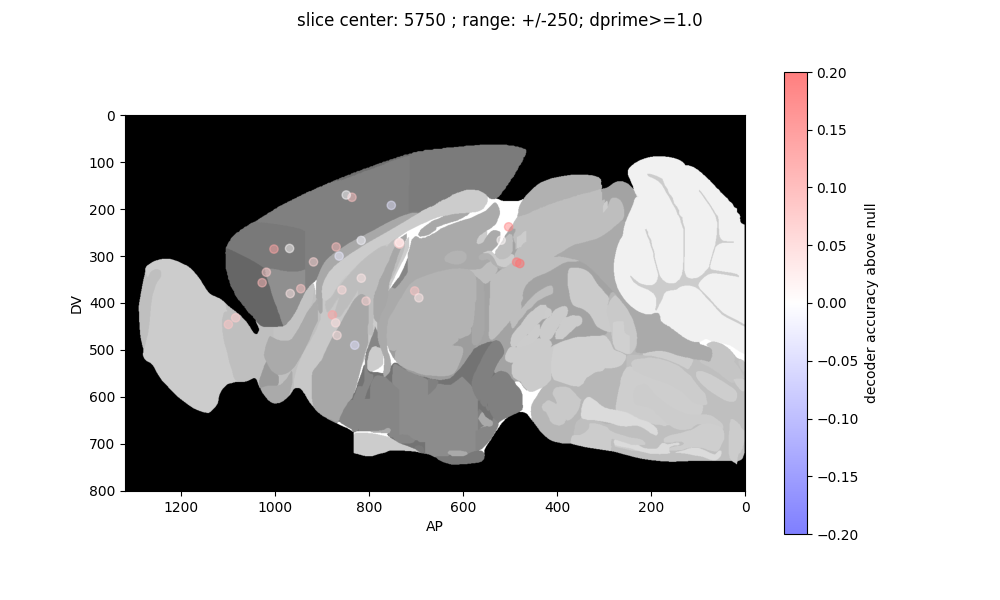

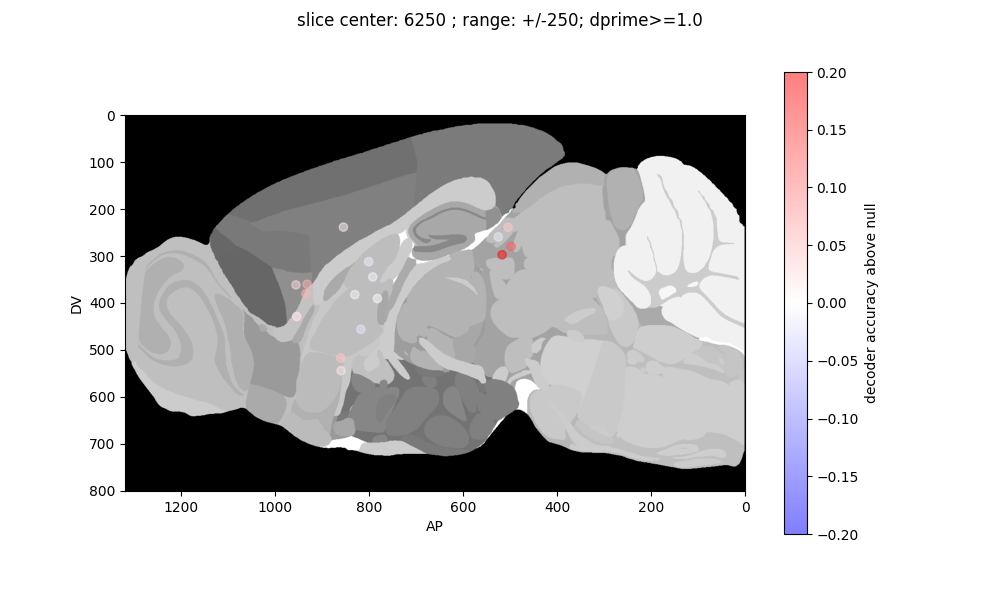

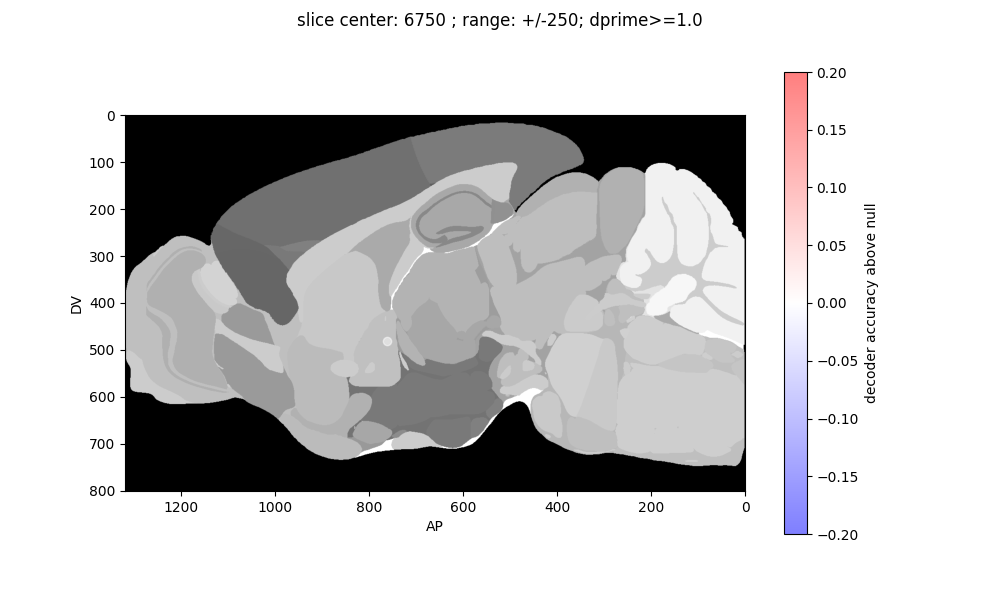

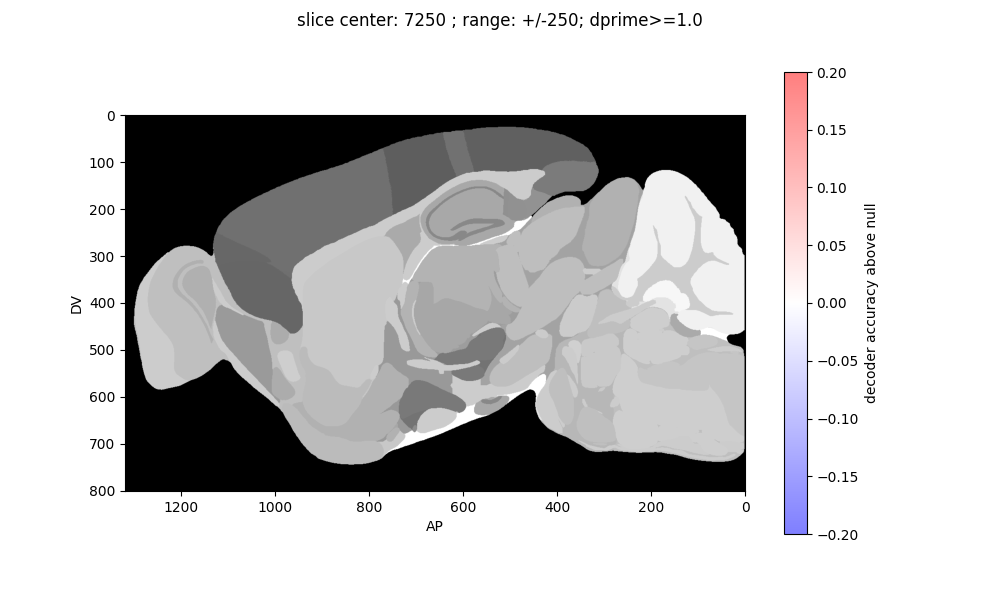

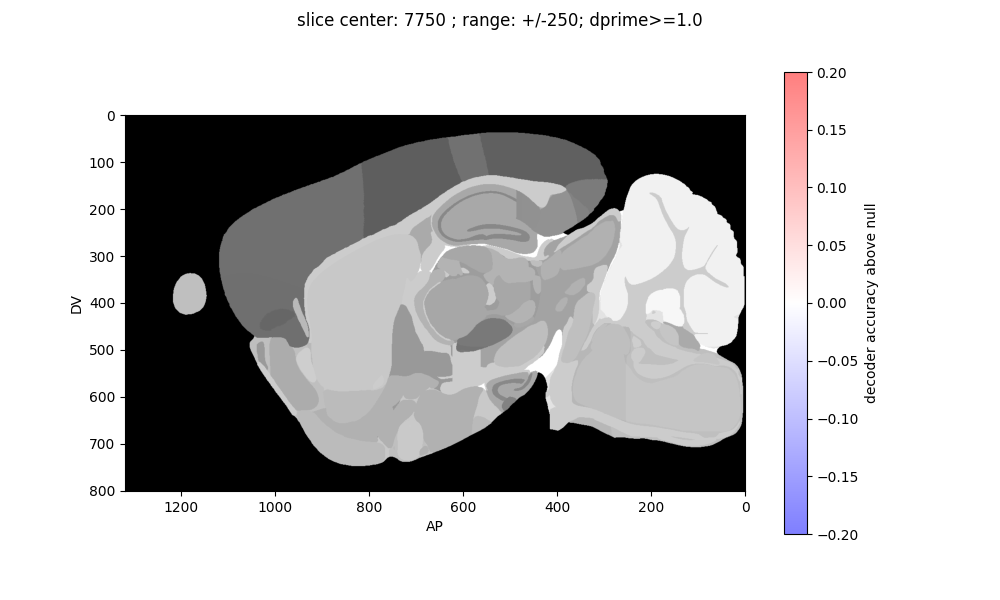

In [15]:
# plot all slices
dprime_thresh=1.0
slice_size=500
slice_pos_array=np.arange(slice_size/2,8000,slice_size)
savepath=r"C:\Users\ethan.mcbride\OneDrive - Allen Institute\quick figures\2024-05-21-decoding_topography"

for slice_pos in slice_pos_array:
    slice_image= rsp.get_slice_image(2, slice_pos)
    results= ccf_coords_by_session_area.query('ccf_ml_mean >= @slice_pos-@slice_size/2 and ccf_ml_mean <= @slice_pos+@slice_size/2 and \
                                               cross_modal_dprime>=@dprime_thresh and project=="DynamicRouting" and area!="all"')

    def rgb2gray(rgb):
        return np.dot(rgb[...,:3], [0.2989, 0.5870, 0.1140])
    
    gray_image = rgb2gray(slice_image) 

    fig = plt.figure(figsize=(10,6))
    ax=plt.subplot(1,1,1)
    ax.imshow(gray_image.T,extent=[1320,0,800,0],cmap='gray') 

    points=ax.scatter(1320-results['ccf_ap_mean']/10,results['ccf_dv_mean']/10,c=results['true_accuracy']-results['null_accuracy_median'],alpha=0.5,cmap='bwr',vmin=-0.2,vmax=0.2)
    ax.set_xlabel('AP')
    ax.set_ylabel('DV')
    fig.colorbar(ax=ax,mappable=points,label='decoder accuracy above null')
    fig.suptitle('slice center: '+str(int(slice_pos))+' ; range: +/-'+str(int(slice_size/2))+'; dprime>='+str(dprime_thresh))

    # filesavepath=os.path.join(savepath,'sagittal_slice_'+str(int(slice_pos))+'.png')
    # plt.savefig(filesavepath,dpi=300)
    # plt.close(fig)

## bin decoder results on ccf